# NLDAS_FORB0125_M.002

This notebook accomplishes the following:

- Downloads data file(s) from NASA
- Shows statistics and visualizations of the attributes

Required libraries:
- `pynio`, for opening GRIB files (requires Python 2)
- `pydap`, for accessing files hosted on gesdisc.eosdis.nasa.gov server
- `holoviews`, for data viz

In [ ]:
#!conda create -n nldas_py27 -c conda-forge -c  elm -c elm/label/dev -c ioam -c ncar pynio elm earthio pydap


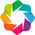

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
import gc
import os

from pydap.cas.urs import setup_session
from six.moves.urllib.parse import urljoin, urlparse
import getpass
import holoviews as hv
import pandas as pd
import requests
import six
import xarray as xr


hv.notebook_extension('bokeh')
%matplotlib inline

In [2]:
url = 'https://hydro1.gesdisc.eosdis.nasa.gov/data/NLDAS/NLDAS_FORB0125_M.002/2017/NLDAS_FORB0125_M.A201706.002.grb'

data_fpath = urlparse(url).path.lstrip(os.sep)
data_dpath = os.path.dirname(data_fpath)
if not os.path.exists(data_fpath):
    session = setup_session(os.environ.get('NLDAS_USERNAME', raw_input('NLDAS Username: ')),
                            os.environ.get('NLDAS_PASSWORD', getpass.getpass('Password: ')))
    resp = session.get(url)
    if not os.path.isdir(data_dpath):
        os.makedirs(data_dpath)
    with open(data_fpath, 'w') as outfp:
        outfp.write(resp.content)
gc.collect()
ds = xr.open_dataset(data_fpath, engine='pynio')
ds

<xarray.Dataset>
Dimensions:               (lat_110: 224, lon_110: 464)
Coordinates:
  * lat_110               (lat_110) float32 25.063 25.188 25.313 25.438 ...
  * lon_110               (lon_110) float32 -124.938 -124.813 -124.688 ...
Data variables:
    BRTMP_110_SFC         (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    A_PCP_110_SFC_acc1h   (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    CAPE_110_SFC          (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    TMP_110_HTGL          (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    DSWRF_110_SFC         (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    WVDIR_110_SFC         (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    ACPCP_110_SFC_acc1h   (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    PRES_110_SFC          (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    V_GRD_110_HTGL        (lat_110, lon_110) float64 nan nan nan nan nan nan ...
    SPF_H_110_HTGL 

In [3]:
info = []
for k in ds.data_vars:
    raster = ds[k]
    about = (k, raster.long_name, raster.units, raster.initial_time)
    about_raster = '{:<20} {} ({}) - {}'.format(*about)
    info.append(about_raster)
print('Rasters in {}\n'.format(os.path.basename(data_fpath)), '\n  '.join(info), sep='\n  ')

Rasters in NLDAS_FOR0125_H.A20071231.2300.001.grb

  BRTMP_110_SFC        Brightness temperature (K) - 12/31/2007 (23:00)
  A_PCP_110_SFC_acc1h  Total precipitation (kg/m^2) - 12/31/2007 (22:00)
  CAPE_110_SFC         Convective available potential energy (J/kg) - 12/31/2007 (23:00)
  TMP_110_HTGL         Temperature (K) - 12/31/2007 (23:00)
  DSWRF_110_SFC        Downward shortwave radiation flux (W/m^2) - 12/31/2007 (23:00)
  WVDIR_110_SFC        Direction of wind waves (deg) - 12/31/2007 (23:00)
  ACPCP_110_SFC_acc1h  Convective precipitation (kg/m^2) - 12/31/2007 (22:00)
  PRES_110_SFC         Pressure (Pa) - 12/31/2007 (23:00)
  V_GRD_110_HTGL       v-component of wind (m/s) - 12/31/2007 (23:00)
  SPF_H_110_HTGL       Specific humidity (kg/kg) - 12/31/2007 (23:00)
  VTCAPE_110_SFC_acc1h Virtual Temperature Based Convective Available Potential Energy (J/kg) - 12/31/2007 (22:00)
  DLWRF_110_SFC        Downward longwave radiation flux (W/m^2) - 12/31/2007 (23:00)
  U_GRD_110_HTGL    

In [4]:
raster

<xarray.DataArray 'VIL_110_SFC' (lat_110: 224, lon_110: 464)>
[103936 values with dtype=float64]
Coordinates:
  * lat_110  (lat_110) float32 25.063 25.188 25.313 25.438 25.563 25.688 ...
  * lon_110  (lon_110) float32 -124.938 -124.813 -124.688 -124.563 -124.438 ...
Attributes:
    gds_grid_type:            [0]
    center:                   US National Weather Service - NCEP (WMC)
    forecast_time_units:      hours
    parameter_table_version:  [130]
    level_indicator:          [1]
    forecast_time:            [0]
    long_name:                Vertically Integrated Liquid
    sub_center:               Environmental Modeling Center
    units:                    kg m^-2
    initial_time:             12/31/2007 (23:00)
    parameter_number:         [206]

In [5]:
df = ds.to_dataframe()
df.head()

ACPCP_110_SFC_acc1h  A_PCP_110_SFC_acc1h  BRTMP_110_SFC  \
lat_110 lon_110                                                                
25.063  -124.938004                  NaN                  NaN            NaN   
        -124.813004                  NaN                  NaN            NaN   
        -124.688004                  NaN                  NaN            NaN   
        -124.563004                  NaN                  NaN            NaN   
        -124.438004                  NaN                  NaN            NaN   

                     CAPE_110_SFC  DLWRF_110_SFC  DSWRF_110_SFC  PRES_110_SFC  \
lat_110 lon_110                                                                 
25.063  -124.938004           NaN            NaN            NaN           NaN   
        -124.813004           NaN            NaN            NaN           NaN   
        -124.688004           NaN            NaN            NaN           NaN   
        -124.563004           NaN            NaN            NaN           NaN   
        -124.438004           NaN            NaN            NaN           NaN   

                     SPF_H_110_HTGL  TMP_110_HTGL  U_GRD_110_HTGL  \
lat_110 lon_110                                                     
25.063  -124.938004             NaN           NaN             NaN   
        -124.813004             NaN           NaN             NaN   
        -124.688004             NaN           NaN             NaN   
        -124.563004             NaN           NaN             NaN   
        -124.438004             NaN           NaN             NaN   

                     VIL_110_SFC  VTCAPE_110_SFC_acc1h  VTCIN_110_SFC_acc1h  \
lat_110 lon_110                                                               
25.063  -124.938004          NaN                   NaN                  NaN   
        -124.813004          NaN                   NaN                  NaN   
        -124.688004          NaN                   NaN                  NaN   
        -124.563004          NaN                   NaN                  NaN   
        -124.438004          NaN                   NaN                  NaN   

                     V_GRD_110_HTGL  WVDIR_110_SFC  
lat_110 lon_110                                     
25.063  -124.938004             NaN            NaN  
        -124.813004             NaN            NaN  
        -124.688004             NaN            NaN  
        -124.563004             NaN            NaN  
        -124.438004             NaN            NaN

In [6]:
df.describe(percentiles=(0.025, 0.05, 0.25, 0.5, 0.75, 0.95, 0.975))

,ACPCP_110_SFC_acc1h,A_PCP_110_SFC_acc1h,BRTMP_110_SFC,CAPE_110_SFC,DLWRF_110_SFC,DSWRF_110_SFC,PRES_110_SFC,SPF_H_110_HTGL,TMP_110_HTGL,U_GRD_110_HTGL,VIL_110_SFC,VTCAPE_110_SFC_acc1h,VTCIN_110_SFC_acc1h,V_GRD_110_HTGL,WVDIR_110_SFC
count,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000,80439.000000
mean,0.002569,0.015140,-3032.010812,8.541857,245.779471,81.162897,94157.720657,0.002927,273.026643,1.381018,-7713.981780,0.009624,0.029532,-1.237594,-7740.901552
std,0.015161,0.118028,4799.370331,67.572159,43.748367,101.766561,6831.878586,0.001909,10.541944,3.003317,4252.842129,0.069501,0.101844,2.694559,4202.692863
min,0.000000,0.000000,-9999.000000,0.000000,122.419998,0.000000,64702.890625,0.000608,248.619995,-13.280000,-9999.000000,0.000000,0.000000,-10.700000,-9999.000000
2.5%,0.000000,0.000000,-9999.000000,0.000000,168.499500,0.000000,77532.328125,0.000950,256.839996,-4.530000,-9999.000000,0.000000,0.000000,-5.910000,-9999.000000
5%,0.000000,0.000000,-9999.000000,0.000000,176.389000,0.000000,80050.093750,0.001075,258.350006,-3.450000,-9999.000000,0.000000,0.000000,-5.270000,-9999.000000
25%,0.000000,0.000000,-9999.000000,0.000000,215.575005,0.000000,90353.453125,0.001770,265.089996,-0.830000,-9999.000000,0.000000,0.000000,-3.230000,-9999.000000
50%,0.000000,0.000000,264.295990,0.000000,245.899994,19.143999,96573.609375,0.002501,270.820007,1.440000,-9999.000000,0.000000,0.000000,-1.470000,-9999.000000
75%,0.000000,0.000000,278.376007,3.232000,273.834991,158.664001,99052.968750,0.003499,281.510010,3.860000,-9999.000000,0.000000,0.010000,0.840000,-9999.000000
95%,0.007500,0.000000,293.480011,18.656000,311.600006,282.936005,101611.687500,0.006147,291.750000,5.750000,240.488007,0.003500,0.156200,3.000000,96.872002


In [8]:
%opts Image RGB [width=300 height=200]
hvds = hv.Dataset(ds)
imgs = [hvds.to(hv.Image, ['lon_110', 'lat_110'], var, group=ds[var].long_name).relabel(var)
        for var in filter(lambda x: 'lat' not in x and 'lon' not in x, ds.variables.keys())]
hv.Layout(imgs)

:Layout
   .Brightness_temperature.BRTMP_110_SFC                                                 :Image   [lon_110,lat_110]   (BRTMP_110_SFC)
   .Total_precipitation.A_PCP_110_SFC_acc1h                                              :Image   [lon_110,lat_110]   (A_PCP_110_SFC_acc1h)
   .Convective_available_potential_energy.CAPE_110_SFC                                   :Image   [lon_110,lat_110]   (CAPE_110_SFC)
   .Temperature.TMP_110_HTGL                                                             :Image   [lon_110,lat_110]   (TMP_110_HTGL)
   .Downward_shortwave_radiation_flux.DSWRF_110_SFC                                      :Image   [lon_110,lat_110]   (DSWRF_110_SFC)
   .Direction_of_wind_waves.WVDIR_110_SFC                                                :Image   [lon_110,lat_110]   (WVDIR_110_SFC)
   .Convective_precipitation.ACPCP_110_SFC_acc1h                                         :Image   [lon_110,lat_110]   (ACPCP_110_SFC_acc1h)
   .Pressure.PRES_110_SFC                                                                :Image   [lon_110,lat_110]   (PRES_110_SFC)
   .V_hyphen_minus_component_of_wind.V_GRD_110_HTGL                                      :Image   [lon_110,lat_110]   (V_GRD_110_HTGL)
   .Specific_humidity.SPF_H_110_HTGL                                                     :Image   [lon_110,lat_110]   (SPF_H_110_HTGL)
   .Virtual_Temperature_Based_Convective_Available_Potential_Energy.VTCAPE_110_SFC_acc1h :Image   [lon_110,lat_110]   (VTCAPE_110_SFC_acc1h)
   .Downward_longwave_radiation_flux.DLWRF_110_SFC                                       :Image   [lon_110,lat_110]   (DLWRF_110_SFC)
   .U_hyphen_minus_component_of_wind.U_GRD_110_HTGL                                      :Image   [lon_110,lat_110]   (U_GRD_110_HTGL)
   .Virtual_Temperature_Based_Convective_Inhibition.VTCIN_110_SFC_acc1h                  :Image   [lon_110,lat_110]   (VTCIN_110_SFC_acc1h)
   .Vertically_Integrated_Liquid.VIL_110_SFC                                             :Image   [lon_110,lat_110]   (VIL_110_SFC)

In [ ]:
imgs[0]

In [ ]:
imgs[1]

In [ ]:
imgs[2]

In [ ]:
imgs[3]

In [ ]:
imgs[4]

In [ ]:
imgs[5]

In [ ]:
imgs[6]

In [ ]:
imgs[7]

In [ ]:
imgs[8]

In [ ]:
imgs[9]

In [ ]:
imgs[10]

In [ ]:
imgs[11]

In [ ]:
imgs[12]

In [ ]:
imgs[13]

In [ ]:
imgs[14]